# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end to end multi-class image classifier using TensorFlow and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data I'm using is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Info about the data:

* Dealing with images (unstructured data) so it's probably best to use deep learning/transfer learning
* There are 120 breeds of dogs(this means there are 120 different classes)
* There are around 10,000+ images in the training set(these images have labels)
* There are around 10,000+ images in the test set(these imagas have no labels because we'll want to predict them)

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog-Breed-ID/dog-breed-identification.zip" -d "drive/MyDrive/Dog-Breed-ID"

# Getting workspace ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we're using a GPU

In [2]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU not available :(


## Getting our data ready(turning it into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first, turning our images into Tensors(Numerical representations)

I'll start by accessing data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-Breed-ID/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

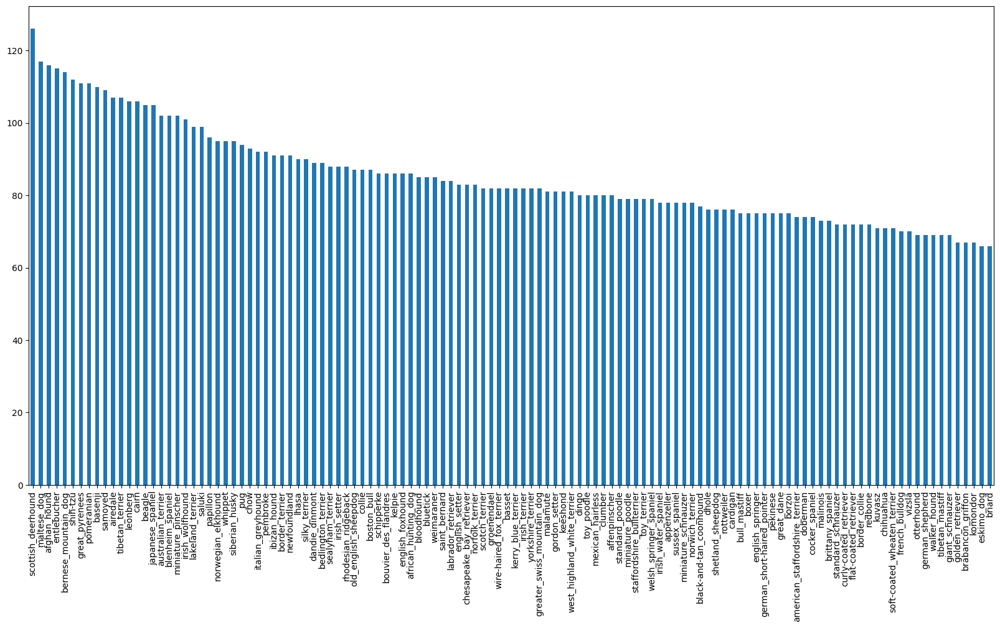

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

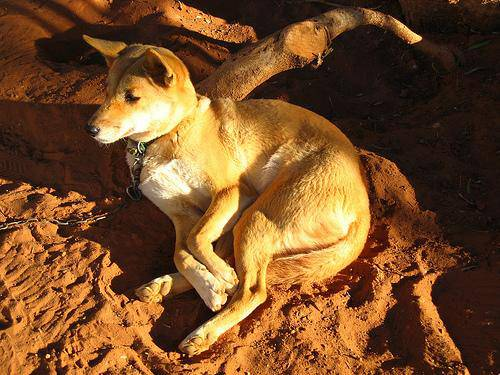

In [7]:
# Exploratory data analysis(EDA). Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-Breed-ID/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Create a list of all of image file pathnames

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathname from image ID's
filenames = ["drive/MyDrive/Dog-Breed-ID/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog-Breed-ID/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check wether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-Breed-ID/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


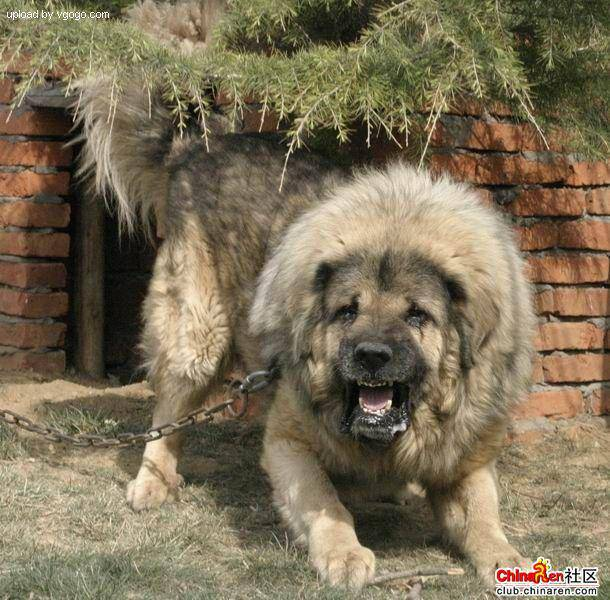

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since I have the training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"] # Another way to do this is: labels = labels_csv["breed"].to_numpy()
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
# Turn a single into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every lable into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # index will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[2])
print(boolean_labels[0].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [24]:
filenames[:10]

['drive/MyDrive/Dog-Breed-ID/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed-ID/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, I'm going to create my own.

In [25]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [26]:
len(filenames)

10222

We're going to start off with experimenting with ~1000 images and increase as needed.

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step: 1000}

In [28]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [29]:
# Let's take a look at the training data
x_train[:2], y_train[:2]

(['drive/MyDrive/Dog-Breed-ID/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-Breed-ID/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be shape of (224, 224)
5. Return the modified `image`

Before we do let's see what importing an image looks like.

In [30]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [32]:
image.max(), image.min()

(255, 0)

In [33]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [34]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Example of what a line in the following function does
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)[:2]

In [ ]:
# Normalization
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(2, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]]], dtype=float32)>

In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg into numerical Tensor with 3 color channels(Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go, they all might not fit into memory.

So that why we do about 32(batch size) images at a time (You can manually adjust the batch size if need be)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [36]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label, processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [37]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tupples of Tensors in the form: `(image, label)`, let's make a function to turn all of our labels into batches.

In [93]:
# Define the batch size, 32 to start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(x) and label(y) pairs.
  Shuffles data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches... ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If the data is a valid dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [39]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to comprehend, let's visualize them.

In [41]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))

  # Loop through 25(for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

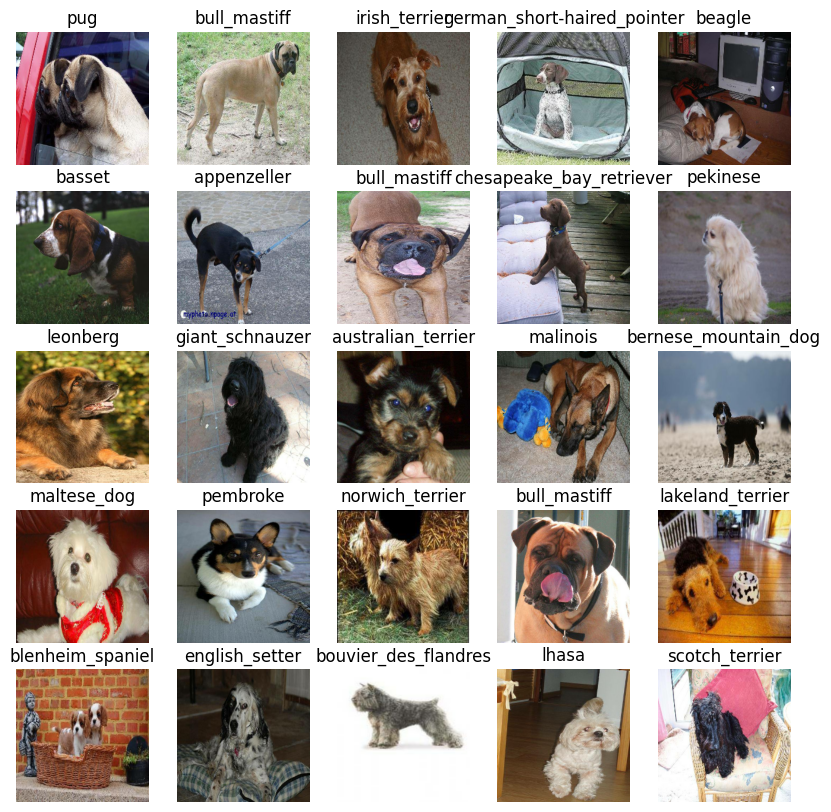

In [43]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

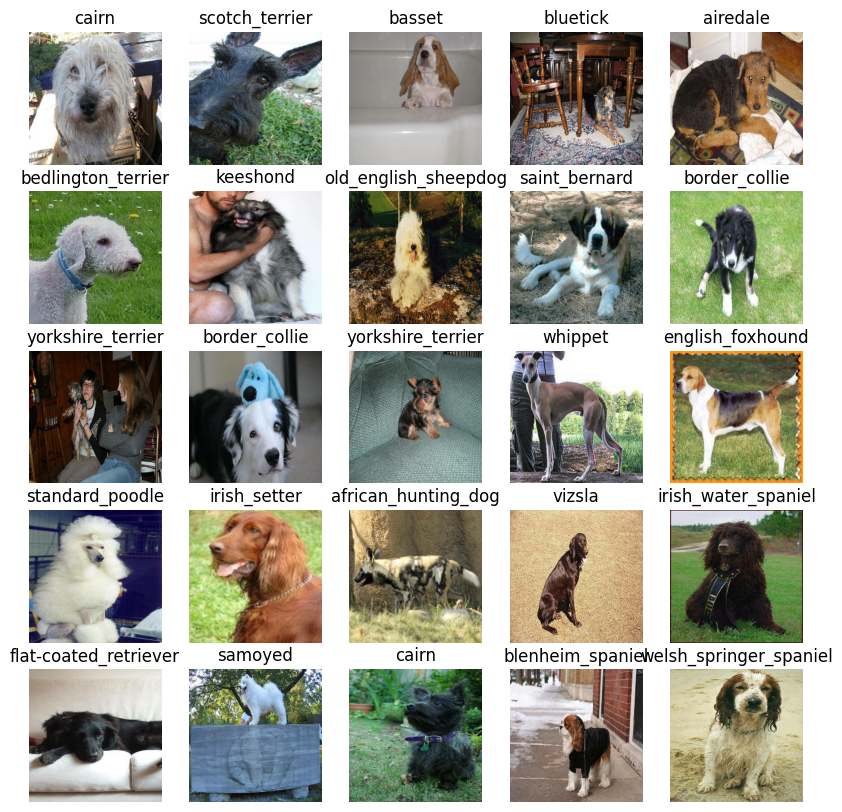

In [44]:
# Now let's visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [45]:
# Setup input shape to the models
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of the models
OUTPUT_SHAPE = len(unique_breeds) # 120 - number of dog breeds

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this, then that)
* Compiles the model(says it should be evaluated and improved)
* Builds the model(tells the model the input shape it'll be getting)
* Returns the model


In [46]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,  # Layer 1(input layer)
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [47]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do things such as saving progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a tensorbaord callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it on to our models `fit()` function.
3. Visualize our models trainin

In [48]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [49]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog-Breed-ID/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

In [50]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

### Training a model(on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [51]:
NUM_EPOCHS = 100 #@param {type:"slider", min: 10, max:100, setp:100}

In [52]:
# Check to make sure if still running on a GPU
print("GPU", "avaliable (YESSSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :()")

GPU not available :()


Let's create a function that trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [53]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1,callbacks=[tensorboard, early_stopping])

  # Return fitted model
  return model

In [54]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 170s 7s/step - loss: 4.5510 - accuracy: 0.0950 - val_loss: 3.6014 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 65s 3s/step - loss: 1.6350 - accuracy: 0.6938 - val_loss: 2.2808 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 66s 3s/step - loss: 0.5638 - accuracy: 0.9375 - val_loss: 1.7354 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 65s 3s/step - loss: 0.2527 - accuracy: 0.9887 - val_loss: 1.5731 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 64s 3s/step - loss: 0.1453 - accuracy: 0.9975 - val_loss: 1.4894 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 66s 3s/step - loss: 0.0992 - accuracy: 1.0000 - val_loss: 1.4345 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 66s 3s/

**Question:** It looks like the model is overfitting because its performing far better on the training dataset than the validation dataset, how can we prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning.

### Check the TensorBoard logs

The TensorBoard magic function (`%tensorboard``) will access the logs directory we created earlier and visualize its contents.

In [55]:
%tensorboard --logdir drive/MyDrive/Dog-Breed-ID/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [56]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 23s 2s/step


array([[1.5902570e-03, 8.4742438e-05, 5.2231509e-04, ..., 3.2572282e-04,
        4.1360512e-05, 3.7960515e-03],
       [2.2588212e-03, 8.9178968e-04, 7.6180799e-03, ..., 1.2325566e-03,
        4.4911932e-03, 1.3049741e-04],
       [1.3636364e-06, 1.4782263e-05, 1.1644228e-06, ..., 7.4670215e-06,
        4.1782005e-05, 4.3107776e-04],
       ...,
       [4.1868329e-06, 2.2404251e-05, 1.9842519e-05, ..., 2.9048676e-06,
        8.3047154e-05, 2.4737514e-04],
       [1.3282746e-03, 2.4974326e-04, 4.1983916e-05, ..., 1.6773191e-04,
        2.6727021e-05, 6.7226179e-03],
       [9.2213583e-04, 1.0332282e-05, 1.2963047e-03, ..., 2.9132331e-03,
        2.2121699e-04, 5.5703229e-05]], dtype=float32)

In [58]:
predictions.shape

(200, 120)

In [59]:
len(y_val), len(unique_breeds)

(200, 120)

In [60]:
predictions[0]

array([1.5902570e-03, 8.4742438e-05, 5.2231509e-04, 1.5145553e-05,
       2.7879007e-04, 1.2061093e-05, 2.1724122e-02, 3.4057631e-04,
       2.0785008e-04, 5.3966709e-04, 2.3094211e-04, 2.2077111e-04,
       1.4042906e-03, 3.2178315e-05, 1.6741050e-04, 8.9383963e-04,
       7.8040699e-05, 8.3074376e-02, 1.6112273e-05, 2.2910832e-04,
       6.0361944e-04, 7.7542674e-05, 5.3528279e-06, 1.5989152e-03,
       1.4816733e-05, 6.7009874e-05, 4.4604757e-01, 5.7156434e-05,
       2.6716350e-04, 3.4308399e-04, 1.8661962e-05, 1.2759248e-03,
       4.3964430e-04, 2.6891963e-05, 4.7090944e-05, 1.8093314e-02,
       2.9804782e-05, 1.5614706e-04, 8.7428700e-05, 5.5569143e-04,
       1.3205388e-03, 3.9707716e-05, 3.8936749e-04, 1.6308755e-04,
       6.5228674e-06, 3.2397325e-04, 7.9252168e-06, 4.5119307e-04,
       5.4452644e-04, 4.6503072e-04, 1.5911224e-04, 2.9554160e-04,
       2.2282201e-04, 3.5776007e-05, 5.8179390e-05, 5.5887485e-05,
       7.7145254e-05, 1.2413386e-03, 2.1056646e-04, 1.2379249e

In [61]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.73719813e-05 1.17797981e-05 1.20357327e-05 6.97850101e-06
 8.86578229e-04 1.17894060e-05 2.06964414e-05 1.83269658e-04
 1.43391248e-02 1.59688219e-02 1.38239166e-05 2.44429793e-06
 1.17292024e-04 1.08904496e-03 5.62167901e-04 1.00197003e-03
 7.25809832e-06 1.32215981e-04 3.54943768e-05 1.48896186e-04
 1.14426821e-05 7.16323993e-05 1.69542709e-05 1.48756881e-05
 7.93240964e-03 5.58212123e-05 9.00331543e-06 1.76423691e-05
 4.73069922e-05 4.70722307e-06 3.48551221e-05 2.58820273e-05
 5.61977049e-06 2.49334926e-06 3.46183742e-06 4.15827981e-06
 3.11311451e-05 7.43468117e-05 1.63231689e-05 6.25795573e-02
 7.33204142e-05 8.42096233e-06 4.78602760e-03 4.80678955e-06
 9.32136463e-05 3.05008848e-06 5.94626981e-05 2.20048416e-04
 1.19337246e-05 1.50554944e-04 1.98178373e-06 7.17171570e-05
 1.10853463e-04 3.14974022e-04 2.67510063e-06 1.10005698e-04
 8.31518773e-05 2.76693445e-05 1.65545462e-05 2.01518401e-06
 1.91902654e-05 4.50478437e-05 1.13808824e-06 8.52054291e-06
 4.11728215e-05 3.588504

In [62]:
unique_breeds[39]

'english_foxhound'

Having the above functionality is great but we want to be able to do it at scale, and it would be even better if we could see the image the prediction is being made on

**Note:** Prediction probabilites is also known as confidence levels

In [63]:
# Turn probabilites into their respective label(easier to understand)
def get_pred_label(prediction_probabilites):
  """
  Turns an array of prediction probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilites)]

  # Get a predicted label based on an array of prediction probabilites
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Since our validation data is still in a batch dataset, we'll have to un-batch it to make predictions on the validation images and then compate those images to the validation labels(truth labels)

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probability or prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)

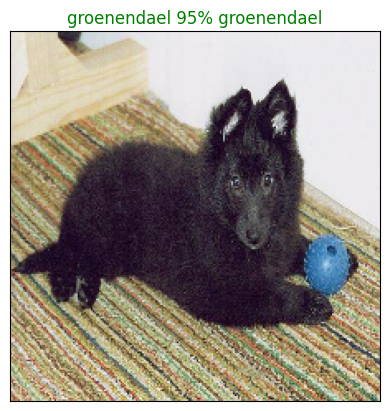

In [67]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

Now we've got one function to visualize our models top prediction, let's make another to view out models top 10 predictions

This function will:
* Take an input of prediction probabilities array, a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values =  pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

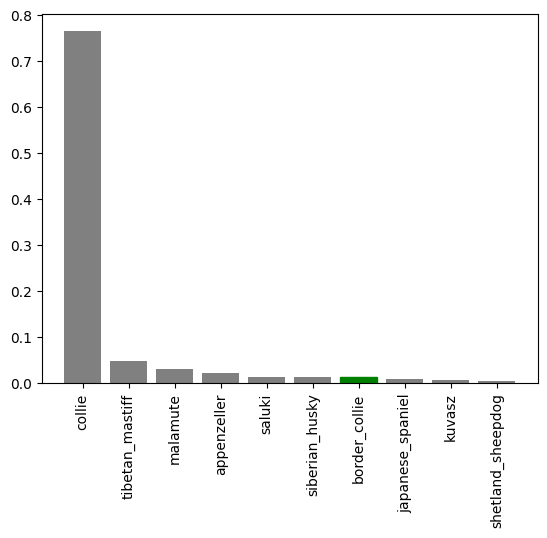

In [71]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, lets check out a few.

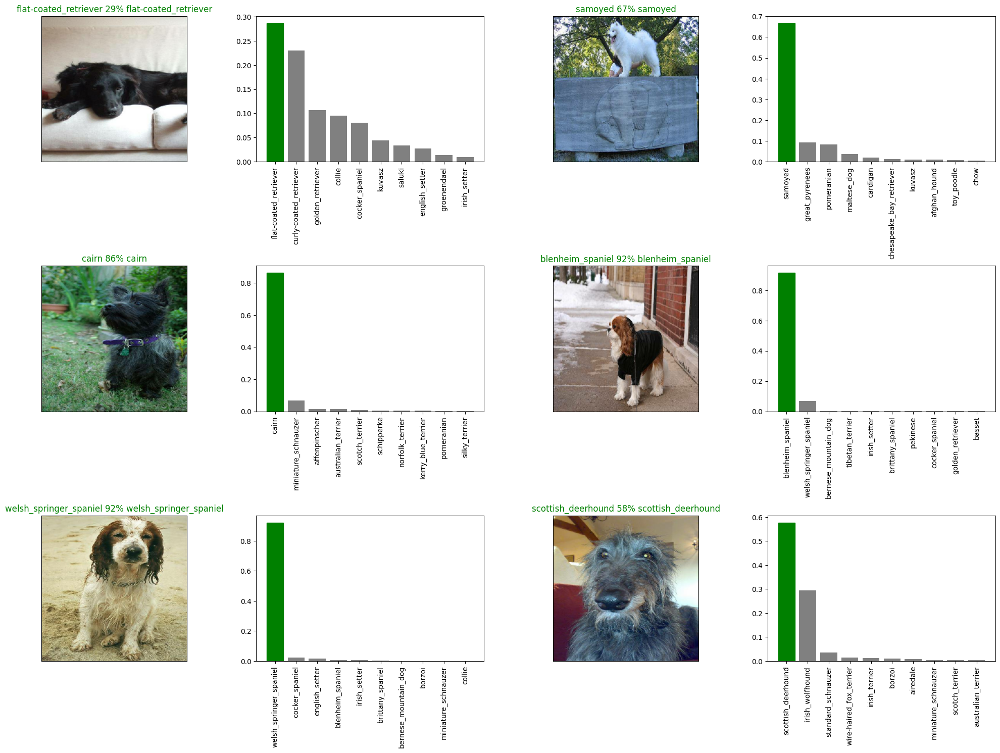

In [72]:
# Lets check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [74]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog-Breed-ID/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [75]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a model, lets make sure they work!

In [76]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam-2")

Saving model to: drive/MyDrive/Dog-Breed-ID/models/20230625-14231687703024-1000-images-mobilenetv2-Adam-2.h5...


'drive/MyDrive/Dog-Breed-ID/models/20230625-14231687703024-1000-images-mobilenetv2-Adam-2.h5'

In [79]:
# Load a train model
loaded_model = load_model("drive/MyDrive/Dog-Breed-ID/models/20230625-14231687703024-1000-images-mobilenetv2-Adam-2.h5")

Loading saved model from: drive/MyDrive/Dog-Breed-ID/models/20230625-14231687703024-1000-images-mobilenetv2-Adam-2.h5


In [80]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.2772 - accuracy: 0.6800


[1.2771552801132202, 0.6800000071525574]

In [81]:
# Evaluate the loaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.2772 - accuracy: 0.6800


[1.2771552801132202, 0.6800000071525574]

## Training a big dog model on the full data

In [82]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [83]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [84]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [85]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [86]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1319s 4s/step - loss: 1.3547 - accuracy: 0.6685
Epoch 2/100
320/320 [==============================] - 601s 2s/step - loss: 0.4004 - accuracy: 0.8804
Epoch 3/100
320/320 [==============================] - 611s 2s/step - loss: 0.2360 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 606s 2s/step - loss: 0.1534 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 578s 2s/step - loss: 0.1069 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 586s 2s/step - loss: 0.0770 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 592s 2s/step - loss: 0.0593 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 577s 2s/step - loss: 0.0448 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 592s 2s/step - loss: 0.0375 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 580s 2s/step - loss: 0.03

NotFoundError: ignored

In [87]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog-Breed-ID/models/20230625-17501687715443-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog-Breed-ID/models/20230625-17501687715443-full-image-set-mobilenetv2-Adam.h5'

In [88]:
# Load in full model
loaded_full_model = load_model("drive/MyDrive/Dog-Breed-ID/models/20230625-17501687715443-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-Breed-ID/models/20230625-17501687715443-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same formats.

We have `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to True(since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [90]:
# Load test image filenames
test_path = "drive/MyDrive/Dog-Breed-ID/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-Breed-ID/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e1cfddc1d5315f1dba011c6152822786.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e6326f6c8ad1e06c0f70546ddfc64067.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/dcab2d03a686ab3f31d1bc3e5700f6d1.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e386eaa78980be7183ecfdd32ecd2aab.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 'drive/MyDrive/Dog-Breed-ID/test/e5ded7a736b3336729463af8d74a09c9.jpg']

In [91]:
len(test_filenames)

10357

In [94]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches... 


In [95]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run

In [96]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1681s 5s/step


In [98]:
# Save predictions (NumPy array) to a csv file (for access later)
np.savetxt("drive/MyDrive/Dog-Breed-ID/preds_array.csv", test_predictions, delimiter=",")

In [101]:
test_predictions = np.loadtxt("drive/MyDrive/Dog-Breed-ID/preds_array.csv", delimiter=",")

In [102]:
test_predictions[:10]

array([[2.33618550e-12, 8.31151681e-09, 2.25437997e-08, ...,
        1.10889610e-10, 1.42788526e-12, 3.82185217e-09],
       [2.99422913e-06, 1.76884569e-08, 9.09322750e-09, ...,
        1.48531423e-10, 4.98091679e-10, 2.48026095e-06],
       [2.05083008e-04, 2.37345787e-09, 1.20386101e-09, ...,
        1.95147560e-08, 2.22035348e-10, 2.98337400e-04],
       ...,
       [1.01701314e-10, 8.58454463e-09, 5.81158698e-01, ...,
        4.09847956e-07, 1.97281445e-08, 1.61945941e-08],
       [1.57112708e-11, 3.23491008e-06, 2.80882184e-09, ...,
        1.95620906e-08, 1.14918301e-07, 7.08957948e-10],
       [3.38582322e-11, 9.32860733e-11, 6.26509745e-06, ...,
        7.55160157e-10, 3.01894870e-10, 2.66065414e-09]])

In [103]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit to Kaggle.

In [104]:
["id"] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [106]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [112]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [113]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,def9a16cb97a7cdd10d6465d642f6bf4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e01a1ea716359e2f0062aca591ff9ca4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e30a97eb637239e3b15c903529e04800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,de5496c6b58f66ab890ab24087d9e220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1cfddc1d5315f1dba011c6152822786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,def9a16cb97a7cdd10d6465d642f6bf4,2.336185e-12,8.311517e-09,2.254380e-08,3.157059e-05,1.010285e-11,3.722575e-09,1.866487e-06,8.616582e-10,1.359994e-09,...,1.608081e-12,1.578194e-11,1.438504e-10,3.715891e-10,2.282911e-09,8.874993e-13,3.368438e-10,1.108896e-10,1.427885e-12,3.821852e-09
1,e01a1ea716359e2f0062aca591ff9ca4,2.994229e-06,1.768846e-08,9.093228e-09,1.755564e-07,3.835644e-07,1.361233e-08,4.111486e-06,3.339914e-07,4.425939e-10,...,3.982217e-05,5.548622e-07,1.424005e-06,2.480344e-08,2.772205e-08,2.017790e-08,5.584476e-09,1.485314e-10,4.980917e-10,2.480261e-06
2,e30a97eb637239e3b15c903529e04800,2.050830e-04,2.373458e-09,1.203861e-09,4.299893e-12,7.039257e-12,7.331581e-10,3.177633e-06,9.939364e-10,1.875762e-10,...,5.857199e-10,4.220257e-09,1.545469e-10,2.082613e-10,9.433907e-10,1.794023e-08,4.717874e-08,1.951476e-08,2.220353e-10,2.983374e-04
3,de5496c6b58f66ab890ab24087d9e220,1.986991e-10,6.876371e-04,1.046890e-09,8.085923e-05,2.554928e-09,1.045492e-07,2.465923e-09,1.925259e-10,1.317047e-08,...,6.518681e-11,4.410918e-12,2.117243e-11,7.833408e-07,2.204302e-08,7.335280e-10,1.647343e-09,5.140387e-07,4.284084e-07,1.679967e-11
4,e1cfddc1d5315f1dba011c6152822786,9.621963e-09,2.066293e-13,1.410763e-08,8.338004e-12,2.674619e-10,1.870294e-12,1.444890e-09,9.193064e-09,1.447327e-11,...,4.129562e-06,4.261472e-06,1.418560e-10,7.199781e-10,4.147590e-10,1.687616e-11,2.973403e-09,5.007033e-05,1.217594e-10,5.825359e-10


In [116]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog-Breed-ID/full-model-predictions-submission-mobilevnet2.csv", index=False)

from operator import methodcaller
from tensorflow.python.ops.gen_logging_ops import ImageSummary
# Making predictions on custom images

To make predictions on custome images, we'll:
* Get the filepaths of our own Images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `data_test()` parameter to `True`.
* Pass the custom image data batch to our models `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [118]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-Breed-ID/random-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [119]:
custom_image_paths

['drive/MyDrive/Dog-Breed-ID/random-dog-photos/puppy2.jpg',
 'drive/MyDrive/Dog-Breed-ID/random-dog-photos/puppy1.jpg']

In [120]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches... 


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [121]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [122]:
custom_preds.shape

(2, 120)

In [124]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['australian_terrier', 'norfolk_terrier']

In [126]:
# Get custom images (our unbatchify() function wont work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

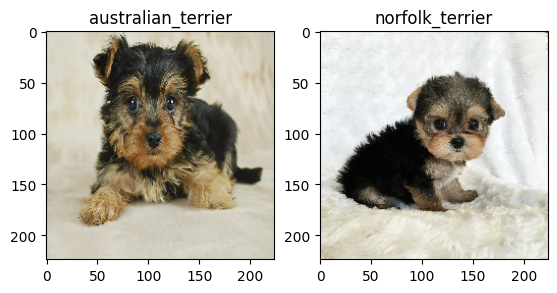

In [127]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks=([])
  plt.yticks=([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)